In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [19]:
df = pd.read_csv('/Users/wonminkim/Projects/DATCapstone/data_preprocessed/df_preprocessed.csv', index_col='Date')

In [20]:
#Let's just focus on 1 day target
df = df.drop(columns = ['Target_1week', 'Target_1month', 'Target_1year'])
df.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,GDP (Billions USD),Unemployment Rate (%),Producer Price Index (PPI),...,reddit_Comment1_Sentiment_negative,reddit_Comment1_Sentiment_neutral,reddit_Comment1_Sentiment_positive,reddit_Comment2_Sentiment_negative,reddit_Comment2_Sentiment_neutral,reddit_Comment2_Sentiment_positive,reddit_Comment3_Sentiment_negative,reddit_Comment3_Sentiment_neutral,reddit_Comment3_Sentiment_positive,Target_1day
Date,,,,,,,,,,,,,,,,,,,,,
2021-09-30,140.983639,141.690227,138.647974,138.863876,89056700,0.0,0.0,23921.991,4.7,235.678,...,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,2.0,1.128616
2021-10-01,139.256465,140.257467,136.518448,139.992493,94639600,0.0,0.0,24777.038,4.5,240.465,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,-3.444611
2021-10-04,139.119068,139.560697,135.694095,136.547882,98322000,0.0,0.0,24777.038,4.5,240.465,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.933304
2021-10-05,136.891371,139.590139,136.763788,138.481186,80861100,0.0,0.0,24777.038,4.5,240.465,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.873398
2021-10-06,136.871718,139.501783,135.792205,139.354584,83221100,0.0,0.0,24777.038,4.5,240.465,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.265991


In [15]:
# Feature Engineering
df['Close_lag1'] = df['Close'].shift(1)
df['Close_lag3'] = df['Close'].shift(3)
df['Close_lag5'] = df['Close'].shift(5)
df['Close_rolling_mean_3'] = df['Close'].rolling(window=3).mean()
df['Close_rolling_mean_7'] = df['Close'].rolling(window=7).mean()

df['Volume_lag1'] = df['Volume'].shift(1)
df['Volume_lag3'] = df['Volume'].shift(3)
df['Volume_lag5'] = df['Volume'].shift(5)
df['Volume_rolling_mean_3'] = df['Volume'].rolling(window=3).mean()
df['Volume_rolling_mean_7'] = df['Volume'].rolling(window=7).mean()

df['articles_sentiment_Positive_lag1'] = df['articles_sentiment_Positive'].shift(1)
df['articles_sentiment_Positive_lag3'] = df['articles_sentiment_Positive'].shift(3)
df['articles_sentiment_Positive_lag5'] = df['articles_sentiment_Positive'].shift(5)
df['articles_sentiment_Positive_rolling_mean_3'] = df['articles_sentiment_Positive'].rolling(window=3).mean()
df['articles_sentiment_Positive_rolling_mean_7'] = df['articles_sentiment_Positive'].rolling(window=7).mean()

df['Producer Price Index (PPI)_lag1'] = df['Producer Price Index (PPI)'].shift(1)
df['Producer Price Index (PPI)_lag3'] = df['Producer Price Index (PPI)'].shift(3)
df['Producer Price Index (PPI)_lag5'] = df['Producer Price Index (PPI)'].shift(5)
df['Producer Price Index (PPI)_rolling_mean_3'] = df['Producer Price Index (PPI)'].rolling(window=3).mean()
df['Producer Price Index (PPI)_rolling_mean_7'] = df['Producer Price Index (PPI)'].rolling(window=7).mean()

df['reddit_Title_Sentiment_negative_lag1'] = df['reddit_Title_Sentiment_negative'].shift(1)
df['reddit_Title_Sentiment_negative_lag3'] = df['reddit_Title_Sentiment_negative'].shift(3)
df['reddit_Title_Sentiment_negative_lag5'] = df['reddit_Title_Sentiment_negative'].shift(5)
df['reddit_Title_Sentiment_negative_rolling_mean_3'] = df['reddit_Title_Sentiment_negative'].rolling(window=3).mean()
df['reddit_Title_Sentiment_negative_rolling_mean_7'] = df['reddit_Title_Sentiment_negative'].rolling(window=7).mean()

df.dropna(inplace = True)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4918
[LightGBM] [Info] Number of data points in the train set: 648, number of used features: 215
[LightGBM] [Info] Start training from score 0.064264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

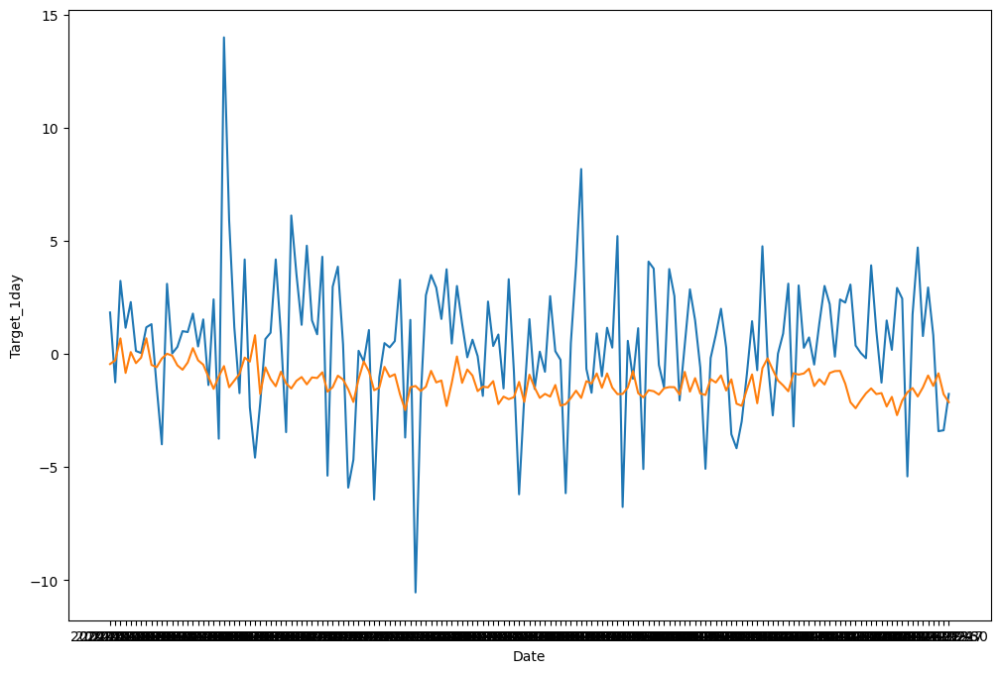

In [16]:
import lightgbm as lgb
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import numpy as np

# 예시용 데이터프레임
# df = pd.read_csv("your_data.csv")
# df 전처리(결측치, 인코딩 등) 후 타겟 분리
X = df.drop(columns=['Target_1day'])
y = df['Target_1day']

# 학습/테스트 분할 (시계열이면 날짜 순서 고려)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# scaler = StandardScaler()

# # fit_transform은 학습 데이터에만 적용해 fit 후 변환
# X_train_scaled = scaler.fit_transform(X_train)
# # 테스트 데이터는 같은 scaler로 transform만 수행
# X_test_scaled = scaler.transform(X_test)

# LightGBM 모델 설정
model_lgb = lgb.LGBMRegressor(
    objective='regression',
    metric='rmse',
    learning_rate=0.05,
    num_leaves=31
)

# 모델 학습
model_lgb.fit(X_train, y_train)

# -----------------------------
# 1. Feature Importance 추출
# -----------------------------
feature_importances = model_lgb.feature_importances_
feature_names = X_train.columns

# 중요도 기준으로 정렬
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)

# 상위 10개 변수 선택
top_features = importance_df['feature'].head(100).tolist()

print("Top 10 Important Features:")
print(top_features)

# -----------------------------
# 2. 상위 10개 변수만 재학습
# -----------------------------
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_lgb_top = lgb.LGBMRegressor(
    objective='regression',
    metric='rmse',
    learning_rate=0.05,
    num_leaves=31
)
model_lgb_top.fit(X_train_top, y_train)

# 예측 및 성능 평가
y_pred = model_lgb_top.predict(X_test_top)
mse = mean_squared_error(y_test, y_pred)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred)

print("Test RMSE:", rmse)
print("Test R2:", r2)

plt.figure(figsize=(12,8))
sns.lineplot(x = y_test.index, y = y_test)
sns.lineplot(x = y_test.index, y = y_pred)
plt.show()

Fitting 5 folds for each of 81 candidates, totalling 405 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007481 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 878
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005285 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 878
[LightGBM] [Info] Number of data points in the train set: 108, number of used featur

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

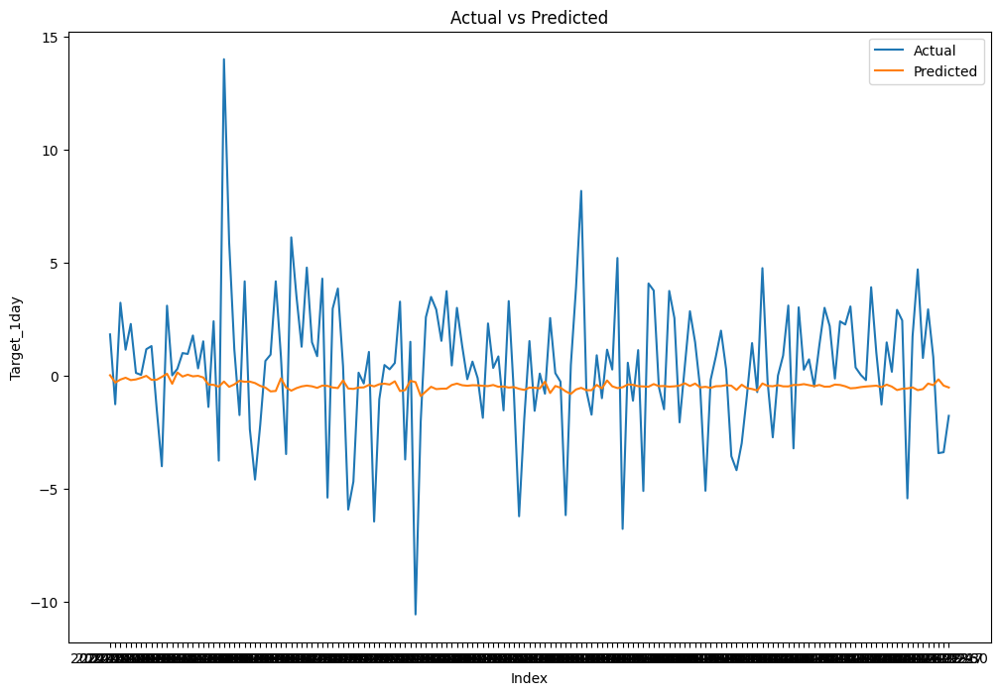

In [17]:
import pandas as pd
import numpy as np
import lightgbm as lgb
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, r2_score

# -------------------------------------------
# 1. 데이터 준비 (예시)
# -------------------------------------------
X = df.drop(columns=['Target_1day'])
y = df['Target_1day']

# 시계열 데이터이므로, shuffle=False
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# -------------------------------------------
# 2. GridSearchCV와 TimeSeriesSplit 설정
# -------------------------------------------
# LightGBM Regressor 기본 모델
lgb_model = lgb.LGBMRegressor(objective='regression', metric='rmse')

# 하이퍼파라미터 그리드 설정 (필요에 따라 범위를 조정하세요)
param_grid = {
    'num_leaves': [31, 50, 70],
    'learning_rate': [0.05, 0.01, 0.1],
    'n_estimators': [100, 500, 1000],
    'max_depth': [-1, 5, 10]  # -1은 제한 없음 의미
}

# 시계열 분할: 5 splits
tscv = TimeSeriesSplit(n_splits=5)

# GridSearchCV 설정: scoring은 음수 MSE로 설정(낮을수록 좋은 값이므로, 최종 RMSE를 구할 때 - 부호를 바꿉니다)
grid_search = GridSearchCV(estimator=lgb_model,
                           param_grid=param_grid,
                           cv=tscv,
                           scoring='neg_mean_squared_error',
                           n_jobs=-1,
                           verbose=1)

# Grid Search 실행 (학습 데이터만 사용)
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best CV RMSE:", np.sqrt(-grid_search.best_score_))

# -------------------------------------------
# 3. 최적 모델로 재학습 및 평가
# -------------------------------------------
# 최적 파라미터를 가진 모델로 전체 학습 데이터에 재학습
best_model = grid_search.best_estimator_
best_model.fit(X_train, y_train)

# 테스트 데이터 예측 및 평가
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("Test RMSE:", rmse)
print("Test R2:", r2)

# -------------------------------------------
# 4. 예측 결과 시각화
# -------------------------------------------
plt.figure(figsize=(12,8))
sns.lineplot(x=y_test.index, y=y_test, label='Actual')
sns.lineplot(x=y_test.index, y=y_pred, label='Predicted')
plt.title("Actual vs Predicted")
plt.xlabel("Index")
plt.ylabel("Target_1day")
plt.show()

# Classification

In [168]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, confusion_matrix

# 예시: df가 이미 로드 및 전처리 되었다고 가정합니다.
# 만약 Target_1day가 연속형 변수라면 아래와 같이 이진 분류로 변환할 수 있습니다.
# 예: 중앙값을 기준으로 0과 1로 분류
df['Target_1day'] = (df['Target_1day'] > df['Target_1day'].mean())

# Feature와 타겟 분리 (분류 문제로 변경)
X = df.drop(columns=['Target_1day'])
y = df['Target_1day']

# 시계열 데이터라면 날짜 순서를 유지해 분할 (비시계열 데이터면 shuffle=True를 고려)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

# -----------------------------
# 1. 기본 모델 학습 (분류)
# -----------------------------
model_lgb = lgb.LGBMClassifier(
    objective='binary',   # 이진 분류인 경우
    learning_rate=0.05,
    num_leaves=31
)

model_lgb.fit(X_train, y_train)

# -----------------------------
# 2. Feature Importance 추출
# -----------------------------
feature_importances = model_lgb.feature_importances_
feature_names = X_train.columns

importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': feature_importances
}).sort_values(by='importance', ascending=False)

# 상위 30개 변수 선택 (필요에 따라 조정)
top_features = importance_df['feature'].head(30).tolist()

print("Top 30 Important Features:")
print(top_features)

# -----------------------------
# 3. 상위 Feature로 재학습
# -----------------------------
X_train_top = X_train[top_features]
X_test_top = X_test[top_features]

model_lgb_top = lgb.LGBMClassifier(
    objective='binary',
    learning_rate=0.05,
    num_leaves=31
)
model_lgb_top.fit(X_train_top, y_train)

# -----------------------------
# 4. 예측 및 평가 (분류 지표)
# -----------------------------
y_pred = model_lgb_top.predict(X_test_top)
y_pred_proba = model_lgb_top.predict_proba(X_test_top)[:, 1]

accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred_proba)
cm = confusion_matrix(y_test, y_pred)

print("Test Accuracy:", accuracy)
print("ROC AUC:", roc_auc)
print("Confusion Matrix:")
print(cm)
print("Classification Report:")
print(classification_report(y_test, y_pred))

Top 30 Important Features:
['Volume', 'Volume_lag3', 'Volume_lag1', 'articles_sentiment_Positive_rolling_mean_7', 'Volume_lag5', 'Volume_rolling_mean_3', 'articles_sentiment_Positive_rolling_mean_3', 'articles_sentiment_Positive_lag5', 'Volume_rolling_mean_7', 'Close_lag5', 'articles_sentiment_Positive_lag1', 'articles_sentiment_Negative', 'High', 'Open', 'Close_rolling_mean_3', 'Close_lag1', 'articles_sentiment_Positive_lag3', 'articles_sentiment_Positive', 'Trade Balance (Billions USD)', 'Close_lag3', 'articles_sentiment_Neutral', 'Industrial Production Index', 'Close_rolling_mean_7', 'Low', 'Producer Price Index (PPI)_rolling_mean_7', 'Close', 'Consumer Confidence Index', 'Housing Starts (Thousands)', 'reddit_Score', 'Unemployment Rate (%)']
Test Accuracy: 0.4110429447852761
ROC AUC: 0.5124960949703218
Confusion Matrix:
[[66  0]
 [96  1]]
Classification Report:
              precision    recall  f1-score   support

       False       0.41      1.00      0.58        66
        True  